In [16]:
from torchvision import models
import numpy as np
import cv2
import PIL
import torch
import torchvision.transforms as transforms

from pytorch_grad_cam import GradCAM,GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image,preprocess_image


In [17]:
def predicted_class_acc(img, model):
    """
    This function takes an image and a pre-trained neural network model, predicts the class label of the image, and returns the predicted class.

    Inputs:
        img (PIL.Image): The input image for which the class label is to be predicted.
        model (torch.nn.Module): Pre-trained neural network model used for classification.

    Outputs:
        pred_class (int): The predicted class label for the input image.
    """
    
    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)), 
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img).unsqueeze(0)  # Add batch dimension

    # Feed the input tensor through the model
    with torch.no_grad():
        logits = model(input_tensor)

    # Apply softmax to get class probabilities
    probs = torch.softmax(logits, dim=1)

    # Get the predicted class label
    pred_class = torch.argmax(probs, dim=1).item()
    print("Predicted class:", pred_class)
    
    return pred_class

Normal ResNet50

In [18]:
def normal_model(model, target_layers, dog_class, img):
    """
    This function generates class activation maps (CAM) using the Grad-CAM method for a given input image with a target class, 
    and returns the prediction of the class of the CAM image using the provided model.

    Inputs:
        model (torch.nn.Module): Pre-trained neural network model.
        target_layers (list): List of layer names to be targeted for generating CAM.
        dog_class (int): Index of the target class.
        img (PIL.Image): Input image.

    Outputs:
        cam_image (PIL.Image): Image with the class activation map overlay.
        predicted_class (int): Predicted class label for the CAM image.
    """
    
    # Instantiate the model
    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class

    input_tensor = preprocess_image(img)

    # Generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
  
    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # Display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)

Schizophrenia

In [19]:
def schizo_model(model, target_layers, dog_class, img):
    """
    This function generates class activation maps (CAM) using the Grad-CAM method for a given input image with a target class.
    and returns the prediction of the class of the CAM image using the provided model.
    
    Inputs:
        model (torch.nn.Module): Pre-trained neural network model.
        target_layers (list): List of layer names to be targeted for generating CAM.
        dog_class (int): Index of the target class.
        img (PIL.Image): Input image.

    Outputs:
        cam_image (PIL.Image): Image with the class activation map overlay.
        predicted_class (int): Predicted class label for the CAM image.
    """

    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class
    input_tensor = preprocess_image(img)

    # Generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)

    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # Display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)

Gaussian Blur 

In [20]:
def gauss_blur(model, target_layers, dog_class, img):
    """
    This function applies Gaussian blur to an input image, generates class activation maps (CAM) using the Grad-CAM method
    for the blurred image, and returns the predicted class of the CAM image using the provided model.

    Inputs:
        model (torch.nn.Module): Pre-trained neural network model.
        target_layers (list): List of layer names to be targeted for generating CAM.
        dog_class (int): Index of the target class.
        img (numpy.ndarray): Input image as a NumPy array.

    Outputs:
        cam_on_blurred (PIL.Image): Image with the class activation map overlay for the blurred image.
        predicted_class (int): Predicted class label for the CAM image.
    """

    # Apply Gaussian blur to the entire image
    blurred_img = cv2.GaussianBlur(img, (35, 35), 0)  # Adjust the kernel size for desired blur intensity

    input_tensor = preprocess_image(blurred_img)

    # Generate CAM
    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_on_blurred = show_cam_on_image(blurred_img, grayscale_cams[0, :], use_rgb=True)

    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # Display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_on_blurred))
    PIL.Image.fromarray(images)

    return cam_on_blurred, predicted_class_acc(cam_on_blurred, model)    

Color Augmentation

In [21]:
def aug_color(model, target_layers, dog_class, img):
    """
    This function applies color augmentation to the input image by increasing the intensity of the red channel,
    generates class activation maps (CAM) using the Grad-CAM method for the augmented image,
    and returns the predicted class of the CAM image using the provided model.

    Inputs:
        model (torch.nn.Module): Pre-trained neural network model.
        target_layers (list): List of layer names to be targeted for generating CAM.
        dog_class (int): Index of the target class.
        img (numpy.ndarray): Input image as a NumPy array.

    Outputs:
        cam_image (PIL.Image): Image with the class activation map overlay for the augmented image.
        predicted_class (int): Predicted class label for the CAM image.
    """

    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class

    # # Split the image into its RGB channels
    b, g, r = cv2.split(img)

    # Decrease intensity of the red channel
    r = cv2.add(r, 0.4)  # Add 1 to the red channel values

    # Clip pixel values to ensure they stay within the range [0, 255]
    r = np.clip(r, 0, 1)

    # Merge the channels back together
    img_color = cv2.merge((b, g, r))

    input_tensor = preprocess_image(img_color)

    # Generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)

    cam_image = show_cam_on_image(img_color, grayscale_cams[0, :], use_rgb=True)
    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # Display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), np.uint8(255*img_color), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)  

In [22]:
def create_models():
    """
    This function creates two models: a normal model and a schizophrenia model, both based on the ResNet50 architecture.
    The normal model uses the pre-trained weights from ImageNet, while the schizophrenia model has a custom fully connected layer.

    Outputs:
        model (torch.nn.Module): Normal model with pre-trained ResNet50 weights.
        model_s (torch.nn.Module): Schizophrenia model based on ResNet50 with a custom fully connected layer.
        target_layers (list): List containing the target layers for generating class activation maps for the normal model.
        target_layers_s (list): List containing the target layers for generating class activation maps for the schizophrenia model.
    """

    ## Normal Mmdel:
    # use the pretrained ResNet50 model

    model = models.resnet50(pretrained=True)
    model.eval()


    ## Schizophrenia model:

    model_s = models.resnet50(pretrained=True)
    model_s.eval()
    model_s.fc = torch.nn.Linear(2048, 255)

    target_layers = [model.layer4]
    target_layers_s = [model_s.layer4]

    return model, model_s, target_layers, target_layers_s


In [23]:
names = ['Lab', 'ST', 'Pug', 'GS'] # Classes
ranges = [(0, 3), (3, 6), (6, 9), (9, 12)] #Ranges for image labels
numbers = [208, 155, 254, 235] # ImageNet Labels

name_to_range = {}

# dictionary (dog_name, dog_range, dog_ID)
for name, range_tuple, number in zip(names, ranges, numbers):
    name_to_range[name] = (list(range(*range_tuple)), number)

# Storage arrays for prediction outputs
predict_arr_n = [] 
predict_arr_b = []
predict_arr_g = []
predict_arr_c = []

In [24]:
def dog_run(dog_type):
    """
    This function processes images of dogs of a specified type. It applies different models and augmentations
    to the images and saves the processed images along with their predictions.

    Inputs:
        dog_type (str): The type of dog for which images are processed.

    Saves:
        final output image to filepath - with concatenated image outputs from model testing 
    """

    testing_model_s_effect = False # set false for paper version

    global name_to_range
    global predict_arr_n
    global predict_arr_b
    global predict_arr_g
    global predict_arr_c

    model, model_s, target_layers, target_layers_s = create_models()

    lab_info = name_to_range.get(dog_type)
    range_list, number = lab_info

    num_label = 1

    for i in range_list: 

        dog_class = [ClassifierOutputTarget(number)]
        print(f"Processing {dog_type} {i+1}: Class {number}")

        ## _________________ INPUT FILEPATH: __________________
        img = np.array(PIL.Image.open(f'/Users/liviamurray/552_ALproj/dogs/{dog_type}/{num_label}.jpeg'))
        ## _____________________________________________________

        img = cv2.resize(img, (300, 300))
        img = np.float32(img) / 255

        normal_image, output_label_n = normal_model(model, target_layers, dog_class, img)

        if not testing_model_s_effect:
    
            bio_plausability_image, output_label_b = schizo_model(model_s, target_layers_s, dog_class, img)
            
            gaussian_blur, output_label_g = gauss_blur(model_s, target_layers_s, dog_class, img)
        
            augmented_colour, output_label_c = aug_color(model_s, target_layers_s, dog_class, img)

        else:
            bio_plausability_image, output_label_b = schizo_model(model_s, target_layers_s, dog_class, img)
            
            gaussian_blur, output_label_g = gauss_blur(model, target_layers, dog_class, img)
        
            augmented_colour, output_label_c = aug_color(model, target_layers, dog_class, img)
    
        # Concatenate the original image with each output image horizontally
        concatenated_img = np.concatenate((np.uint8(255*img), normal_image, bio_plausability_image, gaussian_blur, augmented_colour), axis=1)

        # Add labels to the concatenated image
        label_font = cv2.FONT_HERSHEY_COMPLEX
        label_scale = 0.6
        label_color = (255, 255, 255)
        label_thickness = 1
        cv2.putText(concatenated_img, 'Original', (10, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Normal', (310, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Dysfunctional Connectivity', (610, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Blur', (910, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Augmented Color', (1210, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)

        concatenated_img_bgr = cv2.cvtColor(concatenated_img, cv2.COLOR_RGB2BGR)

        ## _________________ OUTPUT FILEPATH: __________________
        cv2.imwrite(f'/Users/liviamurray/552_ALproj/output_images/{dog_type}_{num_label}_run5.jpg', concatenated_img_bgr) 
        ## _____________________________________________________


        concatenated_img_pil = PIL.Image.fromarray(concatenated_img)

        # Display the concatenated image
        display(concatenated_img_pil)

        predict_arr_n.append([output_label_n, number, f'{dog_type} {num_label}'])
        predict_arr_b.append([output_label_b, number, f'{dog_type} {num_label}'])
        predict_arr_g.append([output_label_g, number, f'{dog_type} {num_label}'])
        predict_arr_c.append([output_label_c, number, f'{dog_type} {num_label}'])

        num_label += 1



Processing Lab 1: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 45
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 247
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

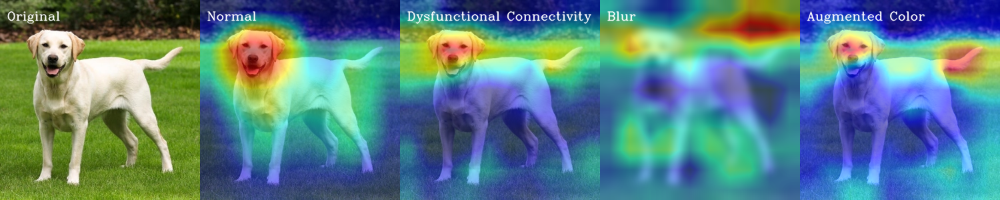

Processing Lab 2: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 45
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 70
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

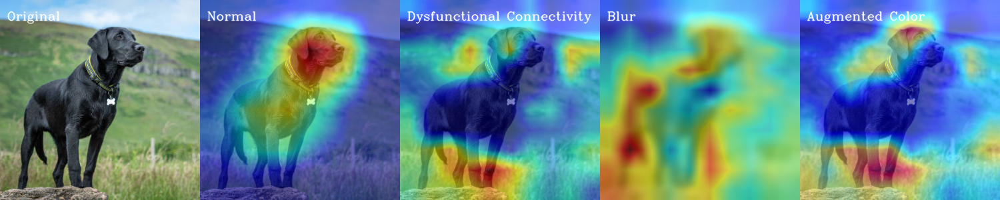

Processing Lab 3: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 749
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 152
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 206
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Li

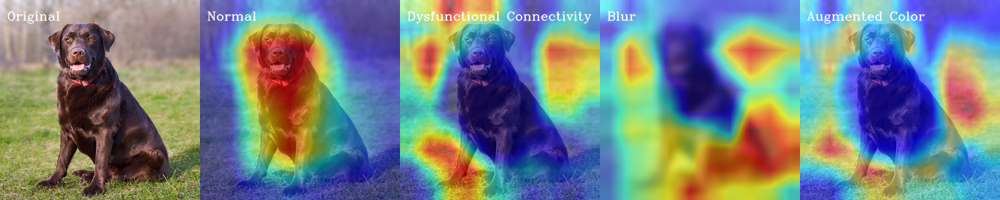

In [25]:
dog_run('Lab')

Processing ST 4: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 283
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 125
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 134
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

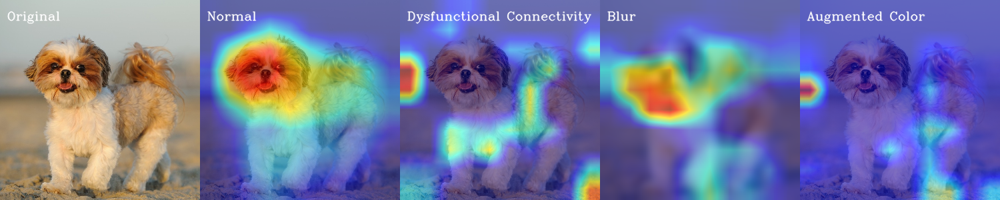

Processing ST 5: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 154
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 125
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 134
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

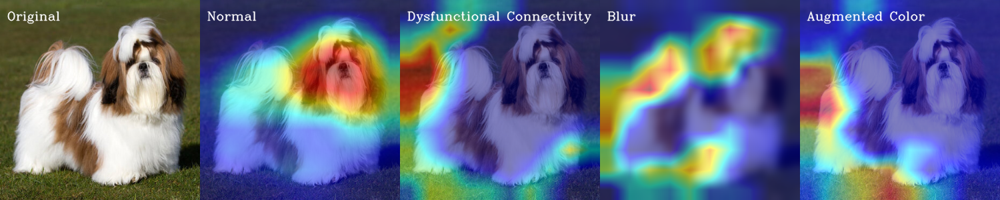

Processing ST 6: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 154
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 81
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 134
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

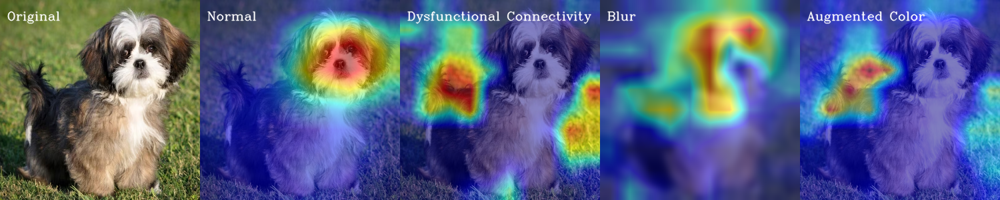

In [26]:
dog_run('ST')

Processing Pug 7: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 862
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 13
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 37
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

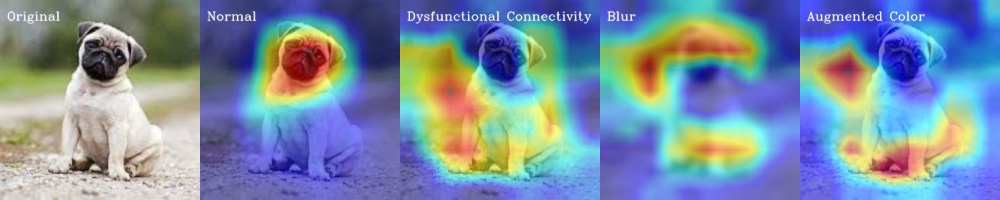

Processing Pug 8: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 238
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 28
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

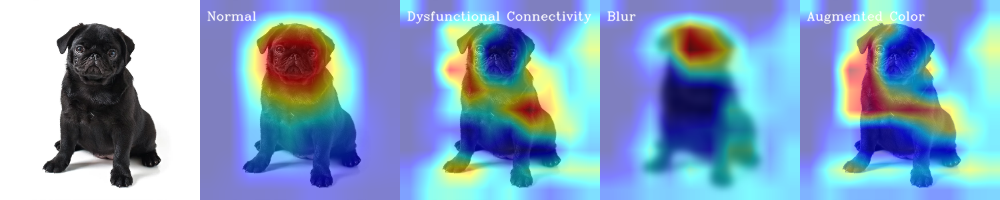

Processing Pug 9: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 13
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 238
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

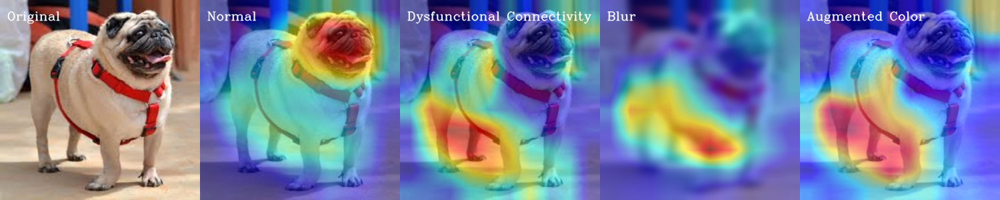

In [27]:
dog_run('Pug')

Processing GS 10: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 77
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 101
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

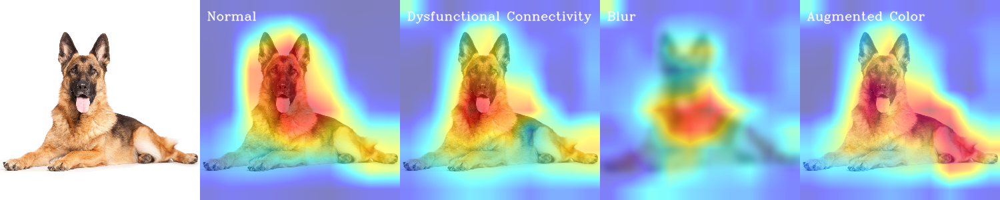

Processing GS 11: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 28
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 73
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

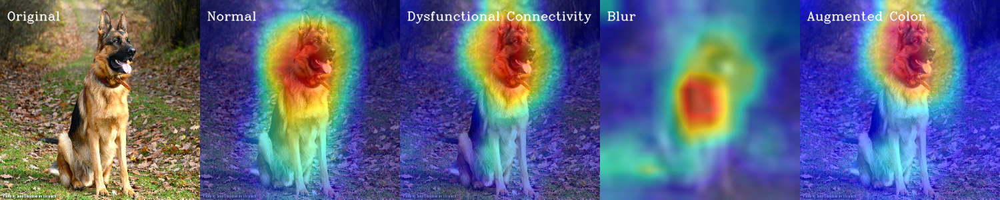

Processing GS 12: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 13
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 101
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

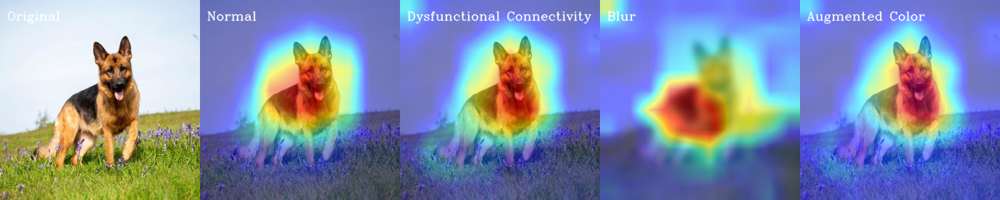

In [28]:
dog_run('GS')

## Performance Eval

In [29]:
nn = ['n', 'b', 'g', 'c']
corr_dict = {}

for letter in nn:
    corr = 0
    for arr in globals()['predict_arr_' + letter]:  # Access the arrays using globals()
        if arr[0] == arr[1]:
            corr += 1
    corr_dict[letter] = corr  # Store the count of correct predictions for each array

# Print the results
for letter, corr in corr_dict.items():
    print(f"Correctly predicted number for '{letter}': {corr} / {len(predict_arr_n)}")

Correctly predicted number for 'n': 4 / 12
Correctly predicted number for 'b': 0 / 12
Correctly predicted number for 'g': 0 / 12
Correctly predicted number for 'c': 0 / 12
